### Logistics Data Analysis: Exploring patterns in dataset

In the logistics industry, identifying the factors that lead to delays is crucial for maintaining customer satisfaction and avoiding potential losses. This dataset offers a comprehensive view of real-world logistics operations, providing an opportunity to explore the complexities of order fulfillment, shipping processes, and customer interactions. Let’s dive in to discover valuable insights and assess how well we can predict delivery delays.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

description_df = pd.read_csv('/content/drive/MyDrive/Testing/Logistic and delay prediction/data/incom2024_delay_variable_description.csv')
data_df = pd.read_csv('/content/drive/MyDrive/Testing/Logistic and delay prediction/data/incom2024_delay_example_dataset.csv')

### Exploring the Data


In [ ]:
data_df.head(3)

,payment_type,profit_per_order,sales_per_customer,category_id,category_name,customer_city,customer_country,customer_id,customer_segment,customer_state,...,order_region,order_state,order_status,product_card_id,product_category_id,product_name,product_price,shipping_date,shipping_mode,label
0,DEBIT,34.448338,92.49099,9.0,Cardio Equipment,Caguas,Puerto Rico,12097.6830,Consumer,PR,...,Western Europe,Vienna,COMPLETE,191.0,9.0,Nike Men's Free 5.0+ Running Shoe,99.99,2015-08-13 00:00:00+01:00,Standard Class,-1
1,TRANSFER,91.193540,181.99008,48.0,Water Sports,Albuquerque,EE. UU.,5108.1045,Consumer,CA,...,South America,Buenos Aires,PENDING,1073.0,48.0,Pelican Sunstream 100 Kayak,199.99,2017-04-09 00:00:00+01:00,Standard Class,-1
2,DEBIT,8.313806,89.96643,46.0,Indoor/Outdoor Games,Amarillo,Puerto Rico,4293.4478,Consumer,PR,...,Western Europe,Nord-Pas-de-Calais-Picardy,COMPLETE,1014.0,46.0,O'Brien Men's Neoprene Life Vest,49.98,2015-03-18 00:00:00+00:00,Second Class,1


### Data Description

In [ ]:
description_df

,variable_name,type,description
0,payment_type,categorical,Type of transaction made
1,profit_per_order,numerical,Earnings per order placed
2,sales_per_customer,numerical,Total sales per customer made per customer
3,category_id,numerical,Product category code
4,category_name,text,Description of the product category
5,customer_city,categorical,City where the customer made the purchase
6,customer_country,categorical,Country where the customer made the purchase
7,customer_id,numerical,Customer ID
8,customer_segment,categorical,"Types of Customers Consumer, Corporate, Home O..."
9,customer_state,categorical,State to which the store where the purchase is...


### Data Cleaning and Preprocessing

Before starting the analysis, it's essential to ensure that our data is clean and well-structured. This involves addressing missing values, converting date columns into datetime objects, and encoding categorical variables properly.

In [ ]:
data_df['order_date'] = pd.to_datetime(data_df['order_date'])
data_df['shipping_date'] = pd.to_datetime(data_df['shipping_date'])

### Exploratory Data Analysis (EDA)

In [ ]:
data_df.describe()

,profit_per_order,sales_per_customer,category_id,customer_id,customer_zipcode,department_id,latitude,longitude,order_customer_id,order_id,...,order_item_product_price,order_item_profit_ratio,order_item_quantity,sales,order_item_total_amount,order_profit_per_order,product_card_id,product_category_id,product_price,label
count,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,...,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000,15549.000000
mean,22.604542,179.888256,31.461342,6583.279789,35458.234968,5.413462,29.677619,-84.512318,6586.810354,35718.970019,...,137.005272,0.120391,2.165202,200.562289,179.780850,22.273342,685.213286,31.387606,136.629368,0.349283
std,99.265198,113.727323,15.303616,4114.273782,37343.702033,1.581550,9.877876,20.681015,4101.324290,21071.742668,...,134.545269,0.474088,1.468627,125.984986,110.999735,117.503163,330.778230,15.256620,133.366285,0.826623
min,-3442.500000,8.351162,2.000000,1.000000,603.000000,2.000000,-33.937553,-158.025990,1.000000,1.000000,...,9.990000,-2.750000,1.000000,9.990000,7.490000,-3442.500000,19.000000,2.000000,9.990000,-1.000000
25%,7.562795,104.397330,18.000000,3119.983200,725.000000,4.000000,18.263327,-98.088170,3177.568800,16530.752000,...,50.000000,0.080000,1.000000,119.980000,105.570910,7.443977,403.000000,18.000000,50.000000,0.000000
50%,31.693370,165.944170,29.000000,6429.229000,19145.775000,5.000000,33.435677,-76.580800,6308.530000,35391.336000,...,59.990000,0.270000,1.000000,199.920000,165.990000,32.440100,627.000000,29.000000,59.990000,1.000000
75%,63.872166,242.440930,45.000000,9642.381000,77502.820000,7.000000,39.277313,-66.370575,9703.070000,55236.910000,...,199.990000,0.360000,3.000000,299.950000,242.436400,64.303566,1004.000000,45.000000,199.990000,1.000000
max,911.800000,1939.990000,76.000000,20757.000000,99205.000000,12.000000,48.781933,115.263080,20757.000000,77204.000000,...,1999.990000,0.500000,5.000000,1999.990000,1939.990000,911.800000,1363.000000,76.000000,1999.990000,1.000000


### Predicting Delays

Using random forest classifier

In [ ]:
X = data_df.drop(columns=['label', 'order_date', 'shipping_date'])
y = data_df['label']

X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
accuracy

0.5811361200428724

Using adaboost classifier

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

X = data_df.drop(columns=['label', 'order_date', 'shipping_date'])
y = data_df['label']

X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = AdaBoostClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 0.5792068595927117


### Model Evaluation
Using a confusion matrix and classification report.

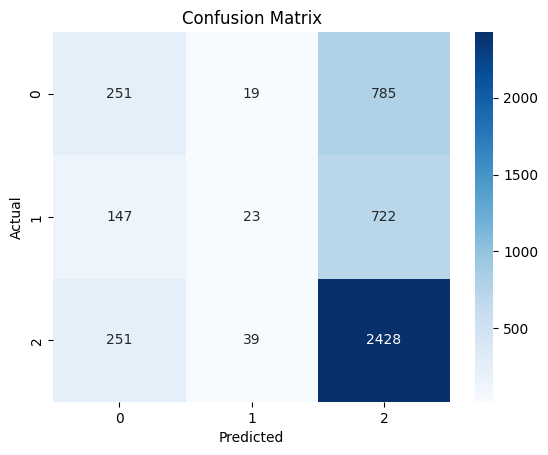

              precision    recall  f1-score   support

          -1       0.39      0.24      0.29      1055
           0       0.28      0.03      0.05       892
           1       0.62      0.89      0.73      2718

    accuracy                           0.58      4665
   macro avg       0.43      0.39      0.36      4665
weighted avg       0.50      0.58      0.50      4665



In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

class_report = classification_report(y_test, y_pred)
print(class_report)

# Customer segementation

Use K-Means clustering to segment customers based on features such as sales_per_customer, profit_per_order, and customer_segment.

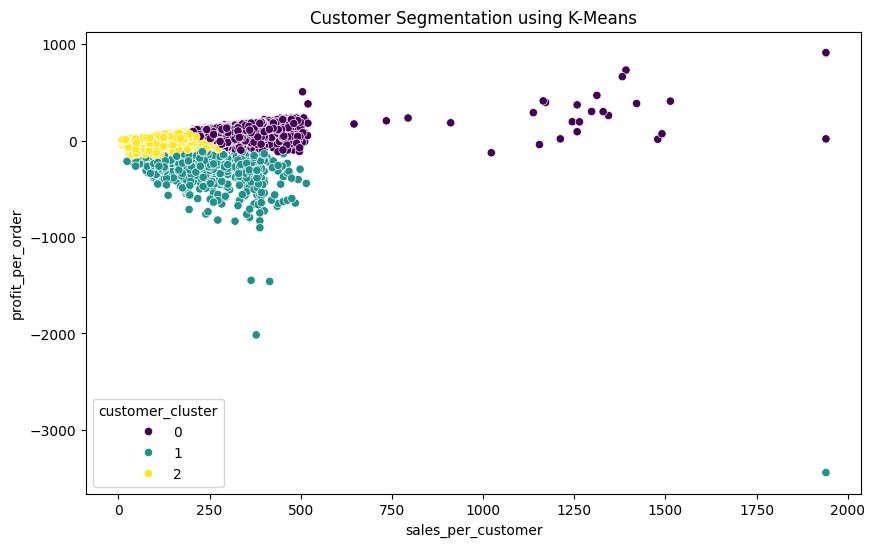

Cluster Centroids: [[ 1.20612470e+00  6.22676404e-01]
 [ 5.36082762e-01 -3.04077111e+00]
 [-4.99486613e-01 -1.06905160e-03]]


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Selecting relevant features for customer segmentation
customer_features = ['sales_per_customer', 'profit_per_order']

# Scaling the features (important for K-Means)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data_df[customer_features])

# Applying K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
data_df['customer_cluster'] = kmeans.fit_predict(scaled_features)

# Visualizing customer clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sales_per_customer', y='profit_per_order', hue='customer_cluster', data=data_df, palette='viridis')
plt.title('Customer Segmentation using K-Means')
plt.show()

# Checking cluster centroids
centroids = kmeans.cluster_centers_
print("Cluster Centroids:", centroids)

#Geospatial analysis

Use latitude and longitude data to map store and order locations. Map visualization using folium or geopandas.

In [ ]:
import folium
from folium.plugins import MarkerCluster

location_data = data_df[['latitude', 'longitude']].dropna()

m = folium.Map(location=[location_data['latitude'].mean(), location_data['longitude'].mean()], zoom_start=2)

marker_cluster = MarkerCluster().add_to(m)

for idx, row in location_data.iterrows():
    folium.Marker([row['latitude'], row['longitude']],
                  popup=f"Latitude: {row['latitude']}, Longitude: {row['longitude']}").add_to(marker_cluster)

# Display the map
m.save('store_order_map.html')
m

                            route  label delay_category
5566     Hialeah -> New York City    1.0        delayed
6386    Lansdale -> San Francisco    1.0        delayed
6410          Las Cruces -> Thane    1.0        delayed
6409  Las Cruces -> Santo Domingo    1.0        delayed
6408        Las Cruces -> Pescara    1.0        delayed
6407        Las Cruces -> Managua    1.0        delayed
6404          Las Cruces -> Essen    1.0        delayed
6403         Laredo -> Warrington    1.0        delayed
6400          Laredo -> Sao Paulo    1.0        delayed
6399      Laredo -> Santo Domingo    1.0        delayed


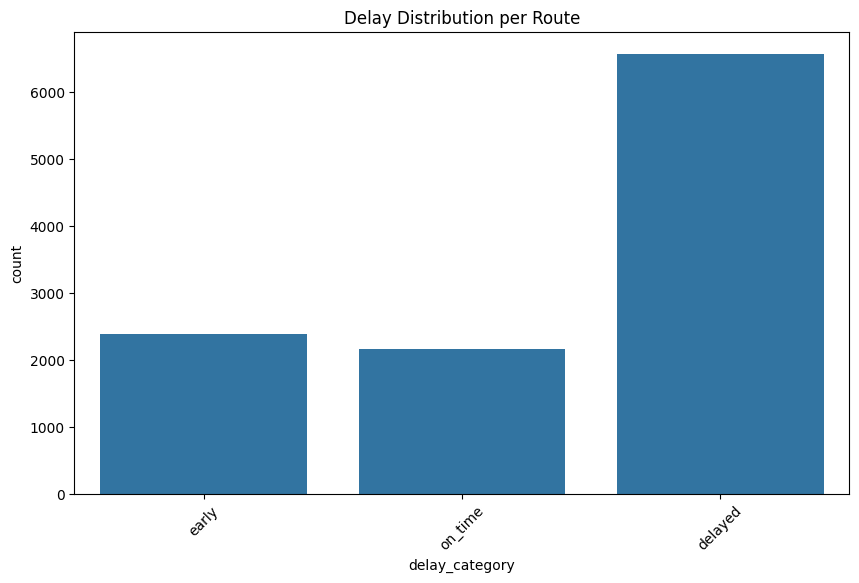

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data_df['route'] = data_df['customer_city'] + ' -> ' + data_df['order_city']

# Anggap -1 (early), 0 (on time), 1 (delayed) sebagai nilai label
route_delay_df = data_df.groupby('route')['label'].mean().reset_index()

# Mengganti mean delay menjadi kategori (early, on-time, delayed)
def categorize_delay(x):
    if x == 0:
        return 'on_time'
    elif x > 0:
        return 'delayed'
    else:
        return 'early'

route_delay_df['delay_category'] = route_delay_df['label'].apply(categorize_delay)

top_delayed_routes = route_delay_df.sort_values(by='label', ascending=False).head(10)
print(top_delayed_routes)

plt.figure(figsize=(10, 6))
sns.countplot(data=route_delay_df, x='delay_category', order=['early', 'on_time', 'delayed'])
plt.title('Delay Distribution per Route')
plt.xticks(rotation=45)
plt.show()